In [1]:
%load_ext autoreload
%autoreload 2

import optuna
import pandas as pd
import lightgbm as lgb
import matplotlib.pyplot as plt
import shap
import numpy as np
import scipy
import seaborn as sns
import lightgbm as lgb
import numpy as np
import sklearn.datasets
import sklearn.metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_auc_score
import pickle
import matplotlib as mpl

from utils.model import Metrics, save_model, load_model

SEED = 42

mpl.rcParams["figure.dpi"] = 200

In [2]:
from transform.load_data import LoadData

loader = LoadData()

# loader.df_train_fe -> (150000, 817)
# loader.df_test_fe -> (150000, 817)

# loader.df_train_bnum -> (671248, 8)
# loader.df_test_bnum -> (669540, 8)

# loader.df_train_dpi -> (6745887, 6)
# loader.df_test_dpi -> (6739211, 6)

## Prepare Data


In [2]:
from utils.pipeline import Pipeline, PipelineStep

from utils.helpers import reduce_mem_usage
from transform.set_missings import set_missings, drop_fraud
from transform.load_data import load_train_data, load_test_data
from transform.feature_selection import feature_selection
from transform.dpi_features import generate_test_dpi_feature, generate_train_dpi_feature
from transform.bnum_features import generate_test_bnum_feature, generate_train_bnum_feature
from transform.fe_features import generate_test_fe_feature, generate_train_fe_feature


def remove_abon_id(df):
    return df.drop("abon_id", axis=1)


def assign_cluster_hot_encoding(df):
    # labels = kmeans.predict(df[features].copy())

    # df["cluster"] = labels

    return df


transform_train_pipeline = Pipeline(
    "TRANSFORM_TRAIN",
    [
        # Load data
        PipelineStep(load_train_data),
        PipelineStep(set_missings),
        # New features
        PipelineStep(generate_train_fe_feature),
        PipelineStep(generate_train_dpi_feature),
        PipelineStep(generate_train_bnum_feature),
        PipelineStep(drop_fraud),
        # Feature selection
        PipelineStep(remove_abon_id),
        PipelineStep(assign_cluster_hot_encoding),
        # PipelineStep(feature_selection),
    ],
)

transform_test_pipeline = Pipeline(
    "TRANSFORM_TEST",
    [
        # Load data
        PipelineStep(load_test_data),
        PipelineStep(set_missings),
        # New features
        PipelineStep(generate_test_fe_feature),
        PipelineStep(generate_test_dpi_feature),
        PipelineStep(generate_test_bnum_feature),
        # Feature selection
        PipelineStep(remove_abon_id),
        PipelineStep(assign_cluster_hot_encoding),
        # PipelineStep(feature_selection),
    ],
)

In [3]:
train_data = transform_train_pipeline.run()

print("Shape:", train_data.shape)

2024-07-25 13:06:12 - Running pipeline: TRANSFORM_TRAIN (0:00:02)
2024-07-25 13:06:12 - 0. Running step: load_train_data (0:00:02)
2024-07-25 13:06:13 - 1. Running step: set_missings (0:00:02)
2024-07-25 13:06:15 - 2. Running step: generate_train_fe_feature (0:00:04)
2024-07-25 13:06:15 - 3. Running step: generate_train_dpi_feature (0:00:05)
2024-07-25 13:06:17 - 4. Running step: generate_train_bnum_feature (0:00:06)
2024-07-25 13:06:18 - 5. Running step: drop_fraud (0:00:07)
2024-07-25 13:06:18 - 6. Running step: remove_abon_id (0:00:08)
2024-07-25 13:06:18 - 7. Running step: assign_cluster_hot_encoding (0:00:08)
2024-07-25 13:06:18 - 9. Done (0:00:08)


-----------------

Shape: (149998, 1443)


In [4]:
test_data = transform_test_pipeline.run()

print("Shape:", test_data.shape)

2024-07-25 13:06:19 - Running pipeline: TRANSFORM_TEST (0:00:09)
2024-07-25 13:06:19 - 0. Running step: load_test_data (0:00:09)
2024-07-25 13:06:19 - 1. Running step: set_missings (0:00:09)
2024-07-25 13:06:21 - 2. Running step: generate_test_fe_feature (0:00:11)
2024-07-25 13:06:22 - 3. Running step: generate_test_dpi_feature (0:00:12)
2024-07-25 13:06:23 - 4. Running step: generate_test_bnum_feature (0:00:13)
2024-07-25 13:06:24 - 5. Running step: remove_abon_id (0:00:14)
2024-07-25 13:06:25 - 6. Running step: assign_cluster_hot_encoding (0:00:14)
2024-07-25 13:06:25 - 8. Done (0:00:14)


-----------------

Shape: (150000, 1444)


In [119]:
from sklearn.model_selection import train_test_split
from transform.feature_selection import EXTENDED_FEATURES, FEATURES

DEMO_FEATURES = EXTENDED_FEATURES + [
    "voice_in_td_cnt_min_diff",
    "voice_in_td_cnt_min_total",
    "abon_part_td_diff",
    "abon_part_td_total",
    "com_num_part_std_diff",
    "com_num_part_std_total",
    "sms_in_cnt_std_diff",
    "sms_in_cnt_std_total",
    "pay_p2p_out_sum_td_diff",
    "pay_p2p_out_sum_td_total",
    "pay_max_td_diff",
    "pay_max_td_total",
    "voice_in_short_part_td_diff",
    "voice_in_short_part_td_total",
    "voice_out_cmpttrs_avg_dumin_diff",
    "voice_out_cmpttrs_avg_dumin_total",
    "SUM_of_Count_events_susp_app_sum",
    "MAX_of_day_cnt_susp_app_sum",
    "SUM_of_Count_events_high_churn_app_sum",
    "vodafone_topic_call_cnt_out_sum",
    "vodafone_topic_call_cnt_out_sum_share",
    "finance_topic_call_cnt_out_sum",
    "rescue_numbers_call_cnt_out_sum",
    "bank_numbers_call_cnt_out_sum",
    "fraud_numbers_call_cnt_out_sum",
    "casual_topic_call_cnt_out_sum",
    "vodafone_act_call_cnt_out",
    "casual_act_call_cnt_out",
    "casual_topic_call_cnt_in_sum",
    "vodafone_topic_call_dur_out_sum",
    "finance_topic_call_dur_out_sum",
    "casual_topic_call_dur_out_sum",
    "competitors_topic_call_dur_out_sum",
    "fraud_numbers_call_dur_out_sum",
    "vodafone_act_call_dur_out",
    "casual_act_call_dur_out",
    "casual_topic_cnt_sms_out_sum",
    "casual_topic_cnt_sms_out_sum_share",
    "other_cnt_sms_out_sum",
    "other_cnt_sms_out_sum_share",
    "vodafone_act_cnt_sms_out",
    "casual_act_cnt_sms_out",
    "other_cnt_sms_in_sum",
    "bank_companies_cnt_sms_in_sum",
    "vodafone_services_cnt_sms_in_sum",
    "vodafone_survey_cnt_sms_in_sum",
    "other_cnt_sms_in_sum_share",
    "vodafone_services_cnt_sms_in_sum_share",
    "bank_companies_cnt_sms_in_sum_share",
    "casual_topic_cnt_sms_in_sum",
    "finance_topic_cnt_sms_in_sum",
    "casual_topic_cnt_sms_in_sum_share",
    "finance_topic_cnt_sms_in_sum_share",
    "vodafone_act_cnt_sms_in",
    "casual_act_cnt_sms_in",
]

DEMO_FEATURES = list(set(DEMO_FEATURES))

scale_pos_weight = (train_data.target.value_counts()[0] / train_data.target.value_counts()[1]).round(2)

sub_train_x, sub_val_x, sub_train_y, sub_val_y = train_test_split(
    train_data[DEMO_FEATURES],
    train_data.target,
    test_size=0.2,
    random_state=SEED,
    stratify=train_data.target,
)

sub_train_df = sub_train_x.copy()
sub_train_df["target"] = sub_train_y

sub_val_df = sub_val_x.copy()
sub_val_df["target"] = sub_val_y

In [120]:
def show_metrics(model_cls, dataframe, features, threshold=0.5):
    X = dataframe[features]
    y_true = dataframe.target

    y_pred_proba = model_cls.predict_proba(X)[:, 1]
    y_pred = (y_pred_proba >= threshold).astype(int)

    Metrics().call(y_true, y_pred, y_pred_proba)

In [121]:
import xgboost as xgb

xgboost_params = {
    "random_state": 42,
    "seed": 42,
    "objective": "binary:logistic",
    "eval_metric": "auc",
    "verbosity": 0,
    "booster": "gbtree",
    "n_jobs": -1,
    "alpha": 8,  # equivalent to lambda_l1
    "lambda": 5,  # equivalent to lambda_l2
    "learning_rate": 0.01,  # reduced learning rate
    "max_depth": 6,  # reduced max depth
    "min_child_weight": 50,  # increased min child weight
    "n_estimators": 500,  # increased number of estimators
    "colsample_bytree": 1,  # increased column sampling
    "subsample": 0.7,  # increased row sampling
    "scale_pos_weight": scale_pos_weight,
}

xgb_cls = xgb.XGBClassifier(**xgboost_params)

xgb_cls.fit(sub_train_x, sub_train_y)

XGBClassifier(alpha=8, base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
              device=None, early_stopping_rounds=None, enable_categorical=False,
              eval_metric='auc', feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, lambda=5, learning_rate=0.01,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=50, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=-1, ...)

In [122]:
show_metrics(xgb_cls, sub_train_df, DEMO_FEATURES, 0.9)
show_metrics(xgb_cls, sub_val_df, DEMO_FEATURES, 0.9)


Metrics
AUC: 0.928
F Beta score: 0.587
Matthews Correlation Coefficient: 0.479
Classification Report:
              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97    112330
         1.0       0.70      0.36      0.48      7668

    accuracy                           0.95    119998
   macro avg       0.83      0.67      0.72    119998
weighted avg       0.94      0.95      0.94    119998


Metrics
AUC: 0.902
F Beta score: 0.564
Matthews Correlation Coefficient: 0.459
Classification Report:
              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97     28083
         1.0       0.66      0.35      0.46      1917

    accuracy                           0.95     30000
   macro avg       0.81      0.67      0.72     30000
weighted avg       0.94      0.95      0.94     30000



In [123]:
from sklearn.model_selection import train_test_split
from transform.feature_selection import EXTENDED_FEATURES
import catboost as cb

catboost_params = {
    "random_seed": 42,
    "objective": "Logloss",
    "eval_metric": "AUC",
    "verbose": 0,
    "boosting_type": "Plain",
    "bootstrap_type": "Bayesian",
    "l2_leaf_reg": 5,
    "learning_rate": 0.01,  # reduced learning rate
    "depth": 8,  # reduced depth
    "min_data_in_leaf": 50,  # increased min data in leaf
    "iterations": 400,  # increased iterations
    "rsm": 0.8,  # increased random subspace method
    "bagging_temperature": 1.5,  # increased bagging temperature
    "scale_pos_weight": 14,  # handling class imbalance
}

cat_cls = cb.CatBoostClassifier(**catboost_params)

cat_cls.fit(
    sub_train_x,
    sub_train_y,
    eval_set=(sub_val_x, sub_val_y),
    verbose=False,
    use_best_model=True,
)

In [124]:
show_metrics(cat_cls, sub_train_df, DEMO_FEATURES, 0.9)
show_metrics(cat_cls, sub_val_df, DEMO_FEATURES, 0.9)
show_metrics(cat_cls, test_data, DEMO_FEATURES, 0.9)


Metrics
AUC: 0.911
F Beta score: 0.537
Matthews Correlation Coefficient: 0.423
Classification Report:
              precision    recall  f1-score   support

         0.0       0.95      0.99      0.97    112330
         1.0       0.68      0.29      0.41      7668

    accuracy                           0.95    119998
   macro avg       0.82      0.64      0.69    119998
weighted avg       0.94      0.95      0.94    119998


Metrics
AUC: 0.897
F Beta score: 0.527
Matthews Correlation Coefficient: 0.414
Classification Report:
              precision    recall  f1-score   support

         0.0       0.95      0.99      0.97     28083
         1.0       0.67      0.29      0.40      1917

    accuracy                           0.95     30000
   macro avg       0.81      0.64      0.69     30000
weighted avg       0.93      0.95      0.93     30000


Metrics
AUC: 0.891
F Beta score: 0.516
Matthews Correlation Coefficient: 0.404
Classification Report:
              precision    recall  f1

In [125]:
model_params = {
    "random_state": 42,
    "seed": 42,
    "objective": "binary",
    "metric": "auc",
    "verbosity": -1,
    "boosting_type": "gbdt",
    "feature_pre_filter": False,
    "n_jobs": -1,
    "lambda_l1": 8,
    "lambda_l2": 5,
    "learning_rate": 0.018,
    "num_leaves": 14,
    "feature_fraction": 0.6803603979260223,
    "bagging_fraction": 0.6735621254996546,
    "max_depth": 11,
    "min_child_samples": 30,
    "n_estimators": 350,
    "drop_rate": 0.2,
    "is_unbalance": True,
}

lgb_cls = lgb.LGBMClassifier(**model_params)

lgb_cls = lgb_cls.fit(sub_train_x, sub_train_y,)

In [126]:
show_metrics(lgb_cls, sub_train_df, DEMO_FEATURES, 0.9)
show_metrics(lgb_cls, sub_val_df, DEMO_FEATURES, 0.9)
show_metrics(lgb_cls, test_data, DEMO_FEATURES, 0.9)


Metrics
AUC: 0.916
F Beta score: 0.558
Matthews Correlation Coefficient: 0.458
Classification Report:
              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97    112330
         1.0       0.65      0.36      0.46      7668

    accuracy                           0.95    119998
   macro avg       0.80      0.67      0.72    119998
weighted avg       0.94      0.95      0.94    119998


Metrics
AUC: 0.901
F Beta score: 0.546
Matthews Correlation Coefficient: 0.450
Classification Report:
              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97     28083
         1.0       0.63      0.36      0.46      1917

    accuracy                           0.95     30000
   macro avg       0.79      0.67      0.71     30000
weighted avg       0.94      0.95      0.94     30000


Metrics
AUC: 0.898
F Beta score: 0.547
Matthews Correlation Coefficient: 0.449
Classification Report:
              precision    recall  f1

In [128]:
lgb_y_train = (sub_train_df.target, lgb_cls.predict_proba(sub_train_x[DEMO_FEATURES])[:, 1])
lgb_y_val = (sub_val_df.target, lgb_cls.predict_proba(sub_val_x[DEMO_FEATURES])[:, 1])

xgb_y_train = (sub_train_df.target, xgb_cls.predict_proba(sub_train_x[DEMO_FEATURES])[:, 1])
xgb_y_val = (sub_val_df.target, xgb_cls.predict_proba(sub_val_x[DEMO_FEATURES])[:, 1])

cat_y_train = (sub_train_df.target, cat_cls.predict_proba(sub_train_x[DEMO_FEATURES])[:, 1])
cat_y_val = (sub_val_df.target, cat_cls.predict_proba(sub_val_x[DEMO_FEATURES])[:, 1])

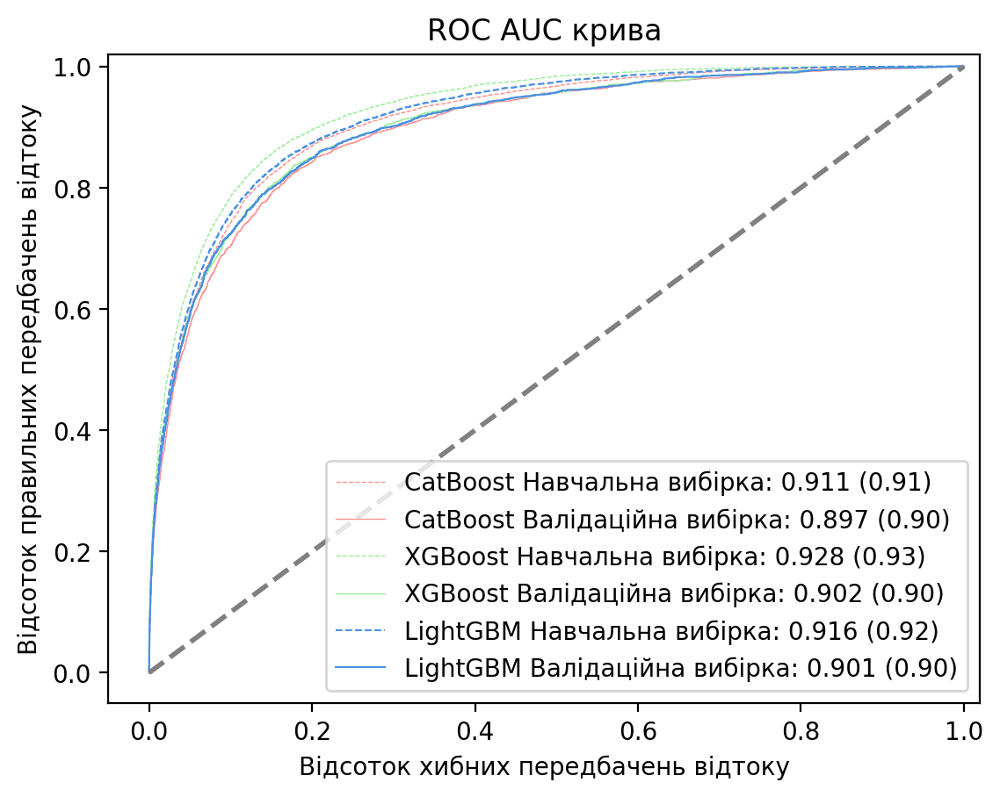

In [131]:
from sklearn.metrics import roc_curve, auc
from types import SimpleNamespace


def get_model_auc_metrics(y_train, y_val):
    fpr_train, tpr_train, _ = roc_curve(*y_train)
    roc_auc_train = auc(fpr_train, tpr_train)

    fpr_val, tpr_val, _ = roc_curve(*y_val)
    roc_auc_val = auc(fpr_val, tpr_val)

    return SimpleNamespace(
        fpr_train=fpr_train,
        tpr_train=tpr_train,
        roc_auc_train=roc_auc_train,
        fpr_val=fpr_val,
        tpr_val=tpr_val,
        roc_auc_val=roc_auc_val,
    )


lgb_metrics = get_model_auc_metrics(lgb_y_train, lgb_y_val)
xgb_metrics = get_model_auc_metrics(xgb_y_train, xgb_y_val)
cat_metrics = get_model_auc_metrics(cat_y_train, cat_y_val)


def render_model_plots(model_metrics, name, color, lw=0.5):
    plt.plot(
        model_metrics.fpr_train,
        model_metrics.tpr_train,
        color=color,
        lw=lw,
        label=f"{name} Навчальна вибірка: {model_metrics.roc_auc_train:.3f} ({model_metrics.roc_auc_train:.2f})",
        linestyle="--",
    )

    plt.plot(
        model_metrics.fpr_val,
        model_metrics.tpr_val,
        color=color,
        lw=lw,
        label=f"{name} Валідаційна вибірка: {model_metrics.roc_auc_val:.3f} ({model_metrics.roc_auc_val:.2f})",
    )


plt.figure()

render_model_plots(cat_metrics, "CatBoost", "#FF9393")
render_model_plots(xgb_metrics, "XGBoost", "#99EE99")
render_model_plots(lgb_metrics, "LightGBM", "#4A90E2", lw=0.75)

plt.plot([0, 1], [0, 1], color="grey", lw=2, linestyle="--")

plt.xlim(-0.05, 1.02)
plt.ylim(-0.05, 1.02)

plt.xlabel("Відсоток хибних передбачень відтоку")
plt.ylabel("Відсоток правильних передбачень відтоку")
plt.title("ROC AUC крива")
plt.legend(loc="lower right")
plt.show()

In [103]:
# train_cache_key = "cache/train_data_pipeline.pkl"
# test_cache_key = "cache/test_data_pipeline.pkl"

# # # Save train / test data
# # with open(train_cache_key, "wb") as f:
# #     pickle.dump(train_data, f)

# # with open(test_cache_key, "wb") as f:
# #     pickle.dump(test_data, f)

# # Load train / test data
# with open(train_cache_key, "rb") as f:
#     train_data = pickle.load(f)

# with open(test_cache_key, "rb") as f:
#     test_data = pickle.load(f)

## Studies

You can find more details in `research/studies`. This folder contains all study strategies I tried
In this section I'll focus on best results I received


In [71]:
import json
import optuna
from utils.helpers import create_or_load_optuna_study
from utils.model import save_model
from imblearn.over_sampling import SMOTE
import sklearn
import random
from sklearn.model_selection import train_test_split
import warnings
from imblearn.under_sampling import RandomUnderSampler

warnings.filterwarnings("ignore")

np.random.seed(SEED)
random.seed(SEED)

VERSION = "new_features_v1"

print("Train data shape:", train_data.shape)

sub_train_x, sub_val_x, sub_train_y, sub_val_y = train_test_split(
    train_data.drop(columns="target"),
    train_data.target,
    test_size=0.2,
    random_state=SEED,
    stratify=train_data.target,
)

sub_train_data = sub_train_x.copy()
sub_train_data["target"] = sub_train_y

resampled_x, resampled_y = oversampling(sub_train_data, not_churned_size=0.7, churned_size=0.7)

dtrain = lgb.Dataset(resampled_x, label=resampled_y)
dvalid = lgb.Dataset(sub_val_x, label=sub_val_y)

static_params = {
    "random_state": SEED,
    "seed": SEED,
    "objective": "binary",
    "metric": "auc",
    "verbosity": -1,
    "boosting_type": "gbdt",
    "feature_pre_filter": False,
    "early_stopping_rounds": 120,
    "n_jobs": -1,
}


def objective(trial):
    params = {
        **static_params,
        "lambda_l1": trial.suggest_int("lambda_l1", 4, 12),
        "lambda_l2": trial.suggest_int("lambda_l2", 4, 12),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.06, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 10, 40, step=2),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.2, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.2, 1.0),
        "max_depth": trial.suggest_int("max_depth", 9, 15),
        "min_child_samples": trial.suggest_int("min_child_samples", 10, 150, step=10),
        "n_estimators": trial.suggest_int("n_estimators", 100, 350, step=25),
        "drop_rate": trial.suggest_categorical("drop_rate", [0.1, 0.2, 0.3, 0.4]),
    }

    print("Params:", params)

    f1_scores = []
    auc_scores = []

    model = lgb.train(
        params,
        dtrain,
        valid_sets=[dvalid],
    )

    def evaluate_model(X, y_true, model, threshold=0.5):
        y_pred_proba = model.predict(X, num_iteration=model.best_iteration)
        y_pred = (y_pred_proba >= threshold).astype(int)
        roc_auc = sklearn.metrics.roc_auc_score(y_true, y_pred_proba)
        f1 = sklearn.metrics.f1_score(y_true, y_pred, pos_label=1)

        auc_scores.append(roc_auc)
        f1_scores.append(f1)

        return roc_auc, f1

    train_X = sub_train_x[resampled_x.columns]
    train_y_true = sub_train_y

    train_roc_auc_score, train_f1_score = evaluate_model(train_X, train_y_true, model)
    print("ROC AUC:", train_roc_auc_score, "F1 Score:", train_f1_score)

    val_X = sub_val_x[resampled_x.columns]
    val_y_true = sub_val_y

    val_roc_auc_score, val_f1_score = evaluate_model(val_X, val_y_true, model)
    print("VAL ROC AUC:", val_roc_auc_score, "VAL F1 Score:", val_f1_score)

    low_auc_penalty = 10 if val_roc_auc_score < 0.9 else 0

    return (
        0.7 * np.mean(auc_scores)
        + 0.3 * np.mean(f1_scores)
        - (10 * np.std(auc_scores))
        - (10 * np.std(f1_scores))
        - low_auc_penalty
    )


study_name = f"LightGbmV5_{VERSION}"

study = optuna.create_study(
    study_name=study_name,
    storage="sqlite:///example.db",
    direction="maximize",
    load_if_exists=True,
)

try:
    study.optimize(objective, n_trials=1000)

finally:
    trial = study.best_trial

    model_params = {**static_params, **trial.params}

    print("Best params:", model_params)

    # save best params
    with open(f"parameters/{study_name}.json", "wb") as f:
        f.write(json.dumps(model_params).encode())

    print("Done!")

Train data shape: (149998, 615)


[I 2024-07-08 21:49:17,081] Using an existing study with name 'LightGbmV5_new_features_v1' instead of creating a new one.


Params: {'random_state': 42, 'seed': 42, 'objective': 'binary', 'metric': 'auc', 'verbosity': -1, 'boosting_type': 'gbdt', 'feature_pre_filter': False, 'early_stopping_rounds': 120, 'n_jobs': -1, 'lambda_l1': 12, 'lambda_l2': 9, 'learning_rate': 0.03008127748685401, 'num_leaves': 62, 'feature_fraction': 0.3532354452134656, 'bagging_fraction': 0.213481396710407, 'max_depth': 11, 'min_child_samples': 140, 'n_estimators': 300, 'drop_rate': 0.2}
ROC AUC: 0.934799799021634 F1 Score: 0.5508196721311476


[I 2024-07-08 21:49:52,714] Trial 1 finished with value: 0.28792761227317015 and parameters: {'lambda_l1': 12, 'lambda_l2': 9, 'learning_rate': 0.03008127748685401, 'num_leaves': 62, 'feature_fraction': 0.3532354452134656, 'bagging_fraction': 0.213481396710407, 'max_depth': 11, 'min_child_samples': 140, 'n_estimators': 300, 'drop_rate': 0.2}. Best is trial 1 with value: 0.28792761227317015.


VAL ROC AUC: 0.9012497810211629 VAL F1 Score: 0.48243412797992474
Best params: {'random_state': 42, 'seed': 42, 'objective': 'binary', 'metric': 'auc', 'verbosity': -1, 'boosting_type': 'gbdt', 'feature_pre_filter': False, 'early_stopping_rounds': 120, 'n_jobs': -1, 'lambda_l1': 12, 'lambda_l2': 9, 'learning_rate': 0.03008127748685401, 'num_leaves': 62, 'feature_fraction': 0.3532354452134656, 'bagging_fraction': 0.213481396710407, 'max_depth': 11, 'min_child_samples': 140, 'n_estimators': 300, 'drop_rate': 0.2}
Done!


### Best results


In [8]:
def show_metrics(model_cls, dataframe, features, threshold=0.5):
    X = dataframe[features]
    y_true = dataframe.target

    y_pred_proba = model_cls.predict_proba(X)[:, 1]
    y_pred = (y_pred_proba >= threshold).astype(int)

    Metrics().call(y_true, y_pred, y_pred_proba)

## Train model


In [98]:
model_params = {
    "random_state": 42,
    "seed": 42,
    "objective": "binary",
    "metric": "auc",
    "verbosity": -1,
    "boosting_type": "gbdt",
    "feature_pre_filter": False,
    "n_jobs": -1,
    "lambda_l1": 8,
    "lambda_l2": 5,
    "learning_rate": 0.018,
    "num_leaves": 14,
    "feature_fraction": 0.6803603979260223,
    "bagging_fraction": 0.6735621254996546,
    "max_depth": 11,
    "min_child_samples": 30,
    "n_estimators": 350,
    "drop_rate": 0.2,
    "is_unbalance": True,
}

model_cls = lgb.LGBMClassifier(**model_params)

train_x = train_data[FEATURES]
train_y = train_data.target

model_cls = model_cls.fit(train_x, train_y)

features = list(train_x.columns)
threshold = 0.5

In [100]:
import sklearn.metrics

print("Train metrics")
show_metrics(model_cls, train_data, FEATURES, 0.9)

Train metrics

Metrics
AUC: 0.912
F Beta score: 0.554
Matthews Correlation Coefficient: 0.470
Classification Report:
              precision    recall  f1-score   support

         0.0       0.96      0.98      0.97    140413
         1.0       0.61      0.40      0.49      9585

    accuracy                           0.95    149998
   macro avg       0.79      0.69      0.73    149998
weighted avg       0.94      0.95      0.94    149998



In [101]:
print("Test metrics")
show_metrics(model_cls, test_data, FEATURES, 0.9)

Test metrics

Metrics
AUC: 0.898
F Beta score: 0.552
Matthews Correlation Coefficient: 0.455
Classification Report:
              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97    140597
         1.0       0.63      0.36      0.46      9403

    accuracy                           0.95    150000
   macro avg       0.80      0.67      0.72    150000
weighted avg       0.94      0.95      0.94    150000



### Save results


In [130]:
# save_model(model_cls, "BEST_FOR_DEFENCE_pipeline_p025_r080_0899auc", list(features))
model_cls, features = load_model("BEST_FOR_DEFENCE_pipeline_p025_r080_0899auc.pickle")

## Learning Curve


In [25]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve


def build_learning_curve_plt(train_sizes, train_scores, val_scores):
    # Calculate mean and standard deviation for training and validation scores
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    val_scores_mean = np.mean(val_scores, axis=1)
    val_scores_std = np.std(val_scores, axis=1)

    # Витягнення даних з найвищими середніми оцінками
    best_train_index = np.argmax(train_scores_mean)
    best_test_index = np.argmax(train_scores_mean)

    best_train_size = train_sizes[best_train_index]
    best_train_score_mean = train_scores_mean[best_train_index]
    best_train_score_std = train_scores_std[best_train_index]

    # Plot learning curve
    plt.figure()
    plt.title("Learning Curve")
    plt.xlabel("Training examples")
    plt.ylabel("ROC-AUC Score")
    plt.grid()

    plt.fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    plt.fill_between(
        train_sizes, val_scores_mean - val_scores_std, val_scores_mean + val_scores_std, alpha=0.1, color="g"
    )
    plt.plot(train_sizes, train_scores_mean, "o-", color="r", label="Training score")
    plt.plot(train_sizes, val_scores_mean, "o-", color="g", label="Cross-validation score")

    plt.legend(loc="best")
    plt.show()

In [86]:
X = train_data[features]
y_true = train_data.target

# Get learning curve data
train_sizes, train_scores, val_scores = learning_curve(
    lgb.LGBMClassifier(**model_params),
    X,
    y_true,
    cv=10,
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 5),
    scoring="roc_auc",
)

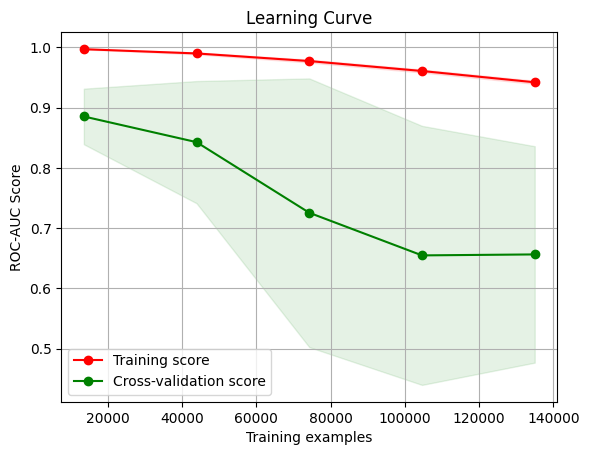

In [85]:
build_learning_curve_plt(train_sizes, train_scores, val_scores)

## Analyze results


In [26]:
from sklearn.metrics import accuracy_score, f1_score
import matplotlib.pyplot as plt


def find_threshold(y_test, y_pred_proba):
    # Define a range of possible thresholds
    thresholds = np.linspace(0, 1, 100)
    accuracies = []

    # Calculate accuracy for each threshold
    for threshold in thresholds:
        y_pred = (y_pred_proba >= threshold).astype(int)
        score = sklearn.metrics.fbeta_score(y_test, y_pred, beta=0.5)
        accuracies.append(score)

    # Find the threshold that provides the highest accuracy
    max_accuracy_index = np.argmax(accuracies)
    optimal_threshold = thresholds[max_accuracy_index]

    print(f"Optimal Threshold for Maximum Score: {optimal_threshold}")
    print(f"Maximum Score: {accuracies[max_accuracy_index]}")

    return optimal_threshold


X = train_data[features]
y_true = train_data.target

y_pred_proba_calibr = model_cls.booster_.predict(X)

optimal_threshold = find_threshold(y_true, y_pred_proba_calibr)

Optimal Threshold for Maximum Score: 0.9090909090909092
Maximum Score: 0.5603615008615536


In [27]:
# Train
train_y_true = train_data.target
train_y_pred_proba = model_cls.booster_.predict(train_data[features])
train_y_pred = (train_y_pred_proba >= optimal_threshold).astype(int)

# Test
test_y_true = test_data.target
test_y_pred_proba = model_cls.booster_.predict(test_data[features])
test_y_pred = (test_y_pred_proba >= optimal_threshold).astype(int)

### ROC Curve


In [28]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc


def plot_roc_curve(y_train, y_test):
    fpr1, tpr1, _ = roc_curve(*y_train)
    roc_auc1 = auc(fpr1, tpr1)

    # fpr2, tpr2, _ = roc_curve(*y_val)
    # roc_auc2 = auc(fpr2, tpr2)

    fpr3, tpr3, _ = roc_curve(*y_test)
    roc_auc3 = auc(fpr3, tpr3)

    plt.figure()
    plt.plot(
        fpr1, tpr1, color="blue", lw=2, label=f"Навчальна вибірка: {roc_auc1:.3f} ({roc_auc1:.2f})", linestyle="--"
    )
    # plt.plot(fpr2, tpr2, color="red", lw=2, label=f"Валідаційна вибірка: {roc_auc2:.3f} ({roc_auc2:.2f})")
    plt.plot(fpr3, tpr3, color="green", lw=2, label=f"Тестова вибірка: {roc_auc3:.3f} ({roc_auc3:.2f})")
    plt.plot([0, 1], [0, 1], color="grey", lw=2, linestyle="--")

    plt.xlabel("Частота хибно позитивних результатів")
    plt.ylabel("Частота істинно позитивних результатів")
    plt.title("ROC AUC крива")
    plt.legend(loc="lower right")
    plt.show()

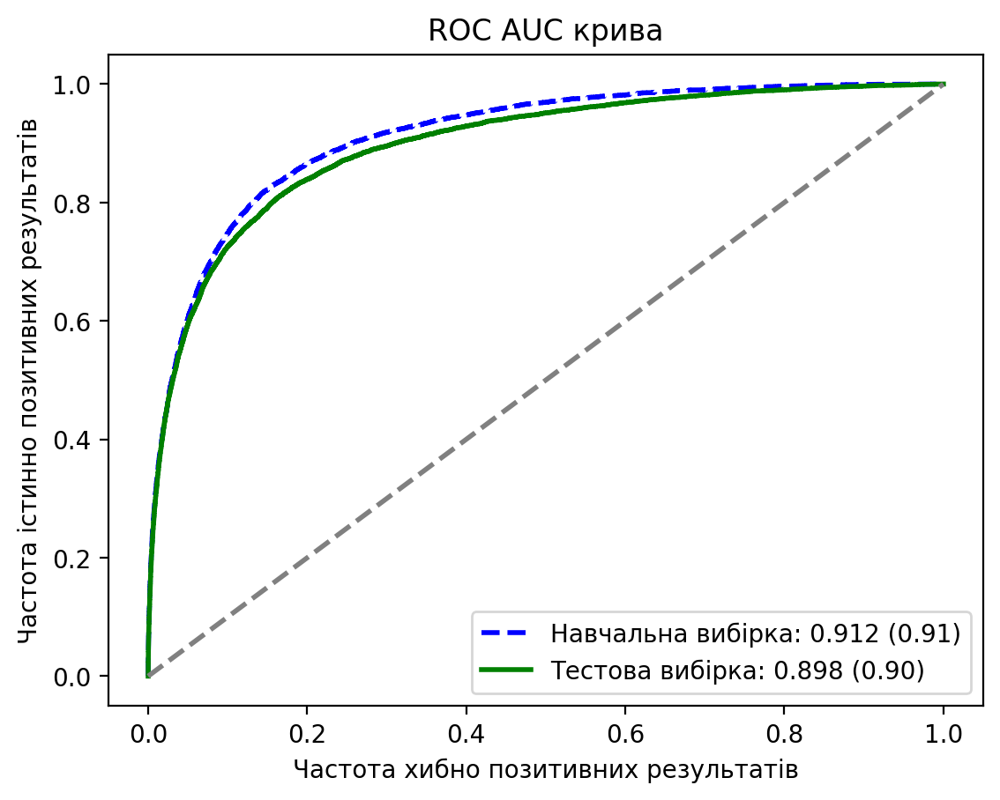

In [29]:
plot_roc_curve((train_y_true, train_y_pred_proba), (test_y_true, test_y_pred_proba))

In [30]:
# Test data

X = test_data[features]
y_pred_proba = test_y_pred_proba
y_pred = test_y_pred
y_true = test_y_true

### Confusion Matrix


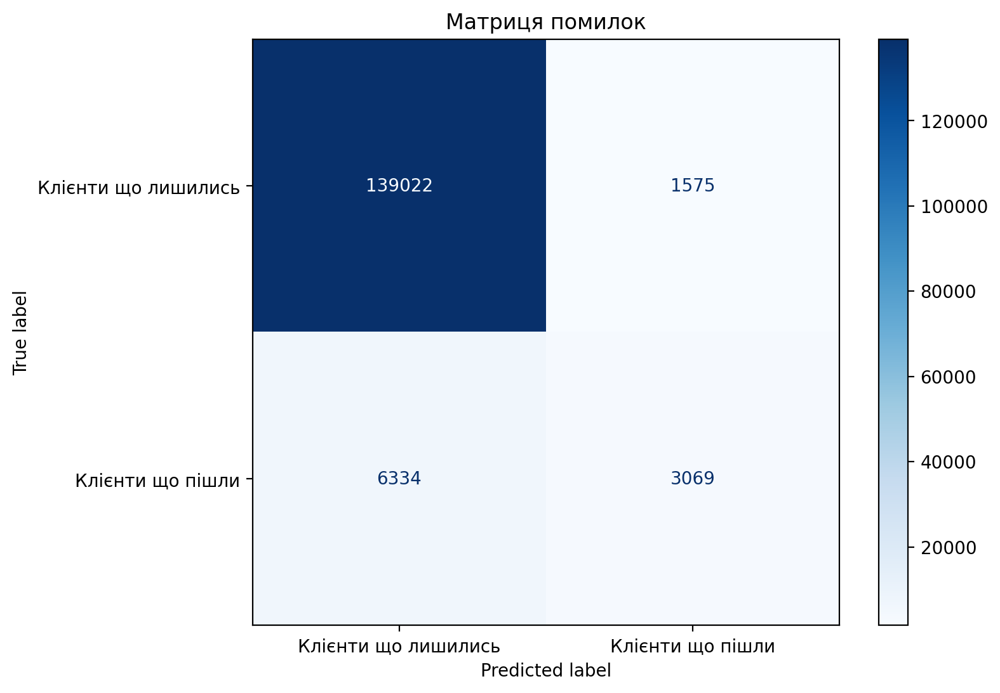

In [31]:
classes = ["Клієнти що лишились", "Клієнти що пішли"]

cm = confusion_matrix(y_true, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(cmap="Blues", ax=ax)
plt.title("Матриця помилок")
plt.show()

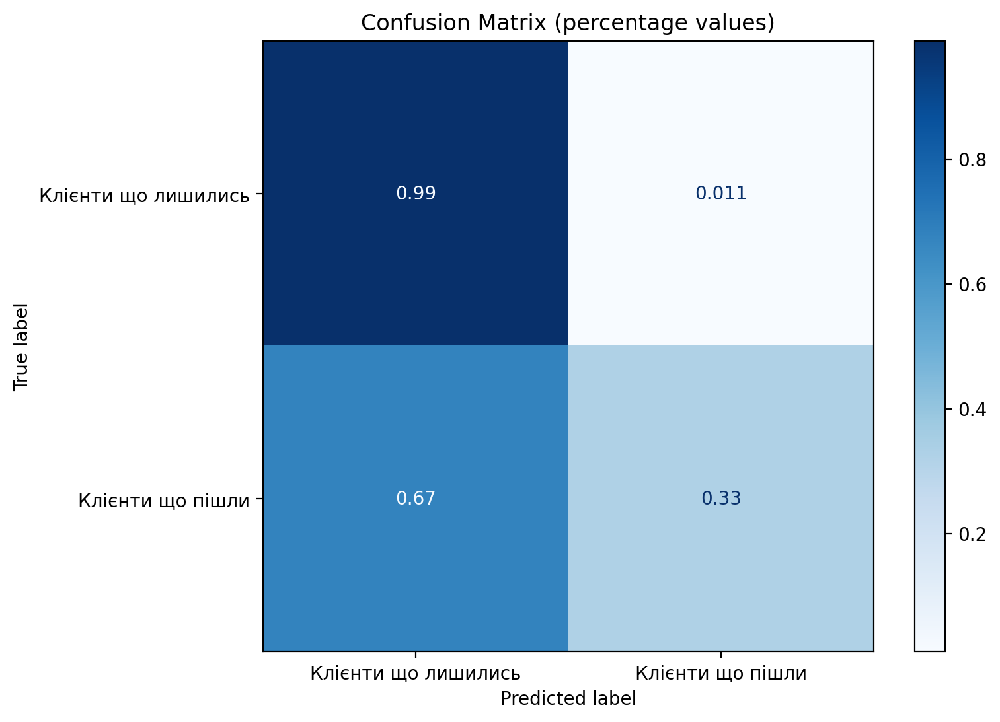

In [32]:
cm = confusion_matrix(y_true, y_pred, normalize="true")

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(cmap="Blues", ax=ax)
plt.title("Confusion Matrix (percentage values)")
plt.show()

### Scoring distribution


In [33]:
import plotly.express as px

pred_df = pd.DataFrame(
    {
        "y_pred_proba": y_pred_proba[y_true == 0],
        "Churn": y_true[y_true == 0],
    }
)

fig = px.histogram(
    pred_df,
    x="y_pred_proba",
    color="Churn",
    marginal="box",
    nbins=100,
    title="Розподіл ймовірностей для класу 'Клієнти що лишились'",
    color_discrete_map={0: "blue", 1: "red"},
)

fig.update_layout(
    bargap=0.1, xaxis_title="Ймовірність того що клієнт піде", yaxis_title="Count", legend_title="Class"
)

fig.update_layout(width=1000, height=400)

fig.show()

In [34]:
import plotly.express as px

pred_df = pd.DataFrame(
    {
        "y_pred_proba": y_pred_proba[y_true == 1],
        "Churn": y_true[y_true == 1],
    }
)

fig = px.histogram(
    pred_df,
    x="y_pred_proba",
    color="Churn",
    marginal="box",
    nbins=100,
    title="Розподіл ймовірностей для класу 'Клієнти що пішли'",
    color_discrete_map={0: "blue", 1: "red"},
)

fig.update_layout(
    bargap=0.1, xaxis_title="Ймовірність того що клієнт піде", yaxis_title="Count", legend_title="Class"
)

fig.update_layout(width=1000, height=400)

fig.show()

### Conversion


In [35]:
df_pred_train = pd.DataFrame(columns=["pred", "pred_proba", "target"])

df_pred_train["pred"] = y_pred.copy()
df_pred_train["pred_proba"] = y_pred_proba.copy()
df_pred_train["target"] = y_true.astype(int).copy()
data_base = df_pred_train[["pred_proba", "target"]]

# Prediction
data_base = data_base.sort_values(by="pred_proba")
data_base.index = np.arange(1, len(data_base) + 1)
data_base["prediction"] = data_base.index / len(data_base)

# Build
base_rate = (1 - data_base["prediction"]) * 100
base_rate = base_rate.apply(np.floor) + 1

# розбиваємо базу по 5% - якщо потрібно по-іншому - замінюємо 5 на інше число
base_rate = (base_rate / 5).apply(np.ceil)
base_rate = base_rate * 5

data_base["rate"] = base_rate

# формуємо фінальну таблицю, зберігаємо
data_stat = data_base[["pred_proba", "target", "rate"]].groupby(["target", "rate"]).count()
data_stat.reset_index(inplace=True)

data_stat = data_stat.pivot(index="rate", columns="target", values="pred_proba")
data_stat = data_stat.fillna(0)

data_stat_df = data_stat.cumsum().reset_index()

data_stat_df.rename(columns={0: "not_churn", 1: "churn"}, inplace=True)

data_stat_df["conversion"] = (
    data_stat_df["churn"] * 100 / (data_stat_df["churn"] + data_stat_df["not_churn"])
).round(2)

# Get last row
total_churn = data_stat_df["churn"].iloc[-1]
total_not_churn = data_stat_df["not_churn"].iloc[-1]

overall_conversion = (total_churn * 100) / (total_churn + total_not_churn)

# Розрахунок Lift для кожного сегмента
data_stat_df["lift"] = data_stat_df["conversion"] / overall_conversion

data_stat_df["churn_coverage"] = (data_stat_df["churn"] * 100) / total_churn
data_stat_df["not_churn_coverage"] = (data_stat_df["not_churn"] * 100) / total_not_churn

data_stat_df

target,rate,not_churn,churn,conversion,lift,churn_coverage,not_churn_coverage
0,5.0,3266,4234,56.45,9.005105,45.028182,2.322951
1,10.0,8996,6005,40.03,6.385728,63.862597,6.398430
2,15.0,15529,6971,30.98,4.942040,74.135914,11.045044
3,20.0,22434,7567,25.22,4.023184,80.474317,15.956244
4,25.0,29549,7951,21.20,3.381899,84.558120,21.016807
5,30.0,36736,8264,18.36,2.928852,87.886845,26.128580
6,35.0,44029,8471,16.14,2.574710,90.088270,31.315746
7,40.0,51359,8641,14.40,2.297139,91.896203,36.529229
8,45.0,58727,8774,13.00,2.073806,93.310646,41.769739
9,50.0,66109,8891,11.85,1.890354,94.554929,47.020207


In [113]:
data_stat_df.to_excel("output.xlsx", index=False)

### Gain and Lift Charts


<Axes: title={'center': 'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

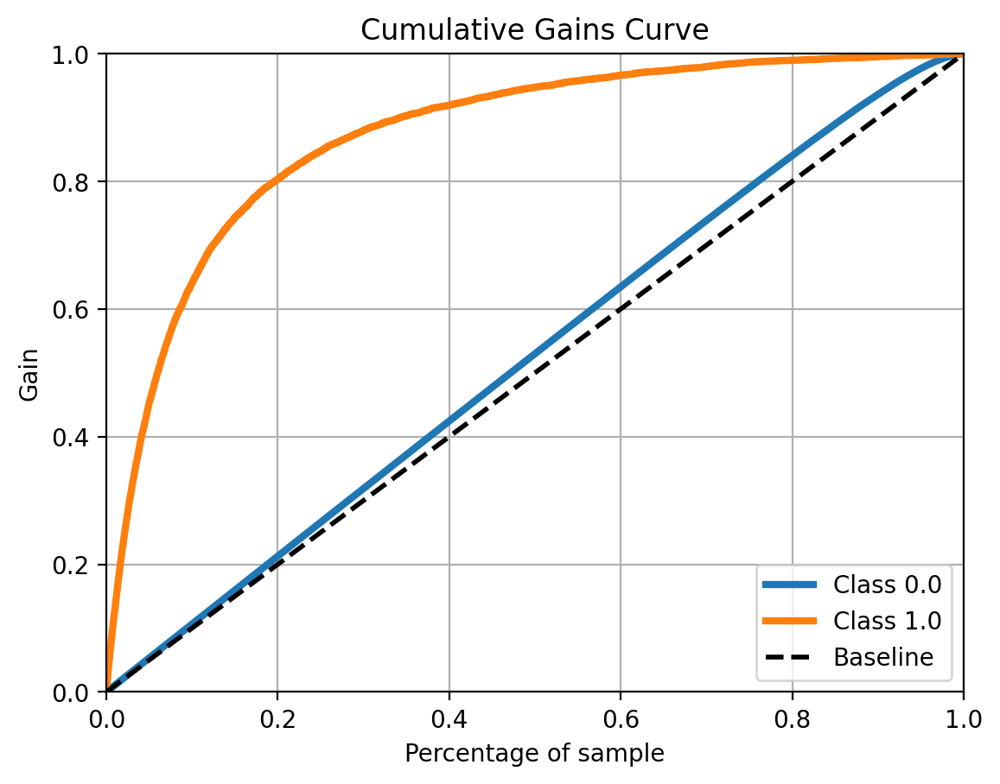

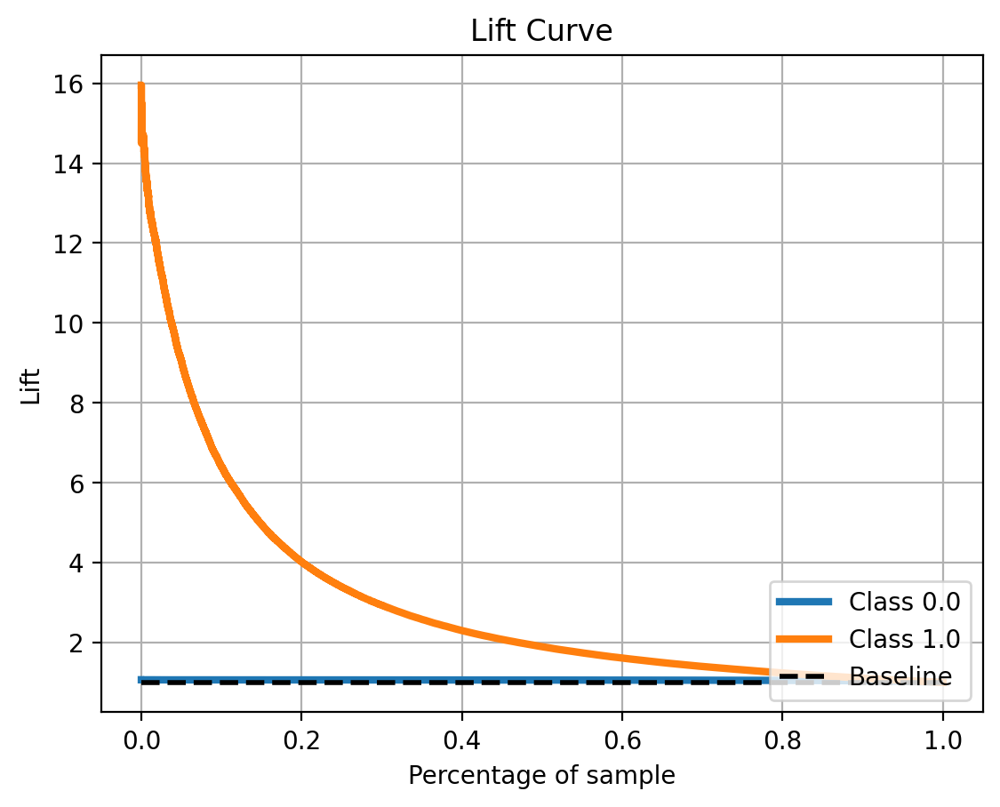

In [19]:
import pandas as pd
import numpy as np
import scikitplot as skplt

y_true = test_data.target
y_pred_prob = model_cls.predict_proba(test_data[features])

skplt.metrics.plot_cumulative_gain(y_true, y_pred_prob)
skplt.metrics.plot_lift_curve(y_true, y_pred_prob)

### Check Threshold Diff


In [20]:
def get_treshold(y_test, y_pred):
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    gmeans = np.sqrt(tpr * (1 - fpr))
    ix = np.argmax(gmeans)
    return thresholds[ix]


y_train_true = train_data.target
y_train_pred_prob = model_cls.predict_proba(train_data[features])[:, 1]

y_test_true = test_data.target
y_test_pred_prob = model_cls.predict_proba(test_data[features])[:, 1]

train_threshold = get_treshold(y_train_true, y_train_pred_prob)
test_threshold = get_treshold(y_test_true, y_test_pred_prob)

print("Treshold (Train): ", train_threshold)
print("Treshold (Test): ", test_threshold)
print("Diff: ", train_threshold - test_threshold)

Treshold (Train):  0.4733262203163667
Treshold (Test):  0.4777749684669242
Diff:  -0.004448748150557513


## Analyze features


In [36]:
importances = model_cls.booster_.feature_importance(importance_type="gain")
importance_df = pd.DataFrame(list(zip(features, importances)), columns=["Feature", "Importance"])

# Report
feature_importances = importance_df.sort_values(by="Importance", ascending=False)
feature_importances = feature_importances[feature_importances.Importance > 5000]

list(feature_importances.Feature)

['num_act_days_min_mnt3',
 'device_days_usage',
 'num_act_days_mea_mnt3',
 'loc_market_share',
 'num_act_days_mea_mnt1',
 'voice_in_td_cnt_min_total',
 'num_act_days_std_total',
 'voice_in_tar_dur_min_mnt1',
 'voice_in_td_cnt_mea_mnt1',
 'lt',
 'days_of_end_last_ppm',
 'voice_out_tar_dur_min_mnt1',
 'all_cnt_min_mnt3',
 'days_of_last_ppm',
 'sms_in_cnt_std_mnt3',
 'day_end_gba',
 'all_cnt_std_total',
 'other_cnt_sms_in_sum',
 'loc_is_obl_center',
 'Balance_uah',
 'conn_out_uniq_cnt_min_total',
 'casual_topic_cnt_sms_in_sum',
 'voice_mts_in_dwork_part_mea_mnt3',
 'num_act_days_std_mnt3',
 'all_cnt_std_mnt1',
 'voice_in_tar_dur_min_total',
 'content_cnt_mea_mnt3',
 'conn_out_uniq_cnt_mea_mnt1',
 'casual_act_cnt_sms_in',
 'voice_in_kievstar_part_mea_total',
 'voice_in_td_cnt_td_total',
 'sum_paym_6_month',
 'imei_mean_days_usage',
 'voice_mts_in_dwork_part_mea_mnt1',
 'MAX_of_day_cnt_susp_app_sum',
 'all_cnt_std_mnt3',
 'sms_in_cnt_std_total',
 'data_3g_tv_cnt_std_mnt3',
 'imei_mean_long_

In [38]:
import plotly.express as px

fig = px.bar(feature_importances[:10], x="Importance", y="Feature", title="Важливість характеристик")
fig.update_layout(yaxis={"categoryorder": "total ascending"}, width=900, height=900)
fig.show()

In [39]:
explainer = shap.TreeExplainer(model_cls)
shap_values = explainer(test_data[features])

In [40]:
shap_importance = pd.DataFrame(
    list(zip(features, np.abs(shap_values.values).mean(axis=0))), columns=["feature", "importance"]
).sort_values(by="importance", ascending=False)

shap_features = shap_importance[:10]

list(shap_features.feature)

['num_act_days_min_mnt3',
 'device_days_usage',
 'num_act_days_mea_mnt1',
 'num_act_days_std_total',
 'lt',
 'num_act_days_mea_mnt3',
 'Balance_uah',
 'loc_market_share',
 'sms_in_cnt_std_mnt3',
 'voice_in_kievstar_part_mea_total']

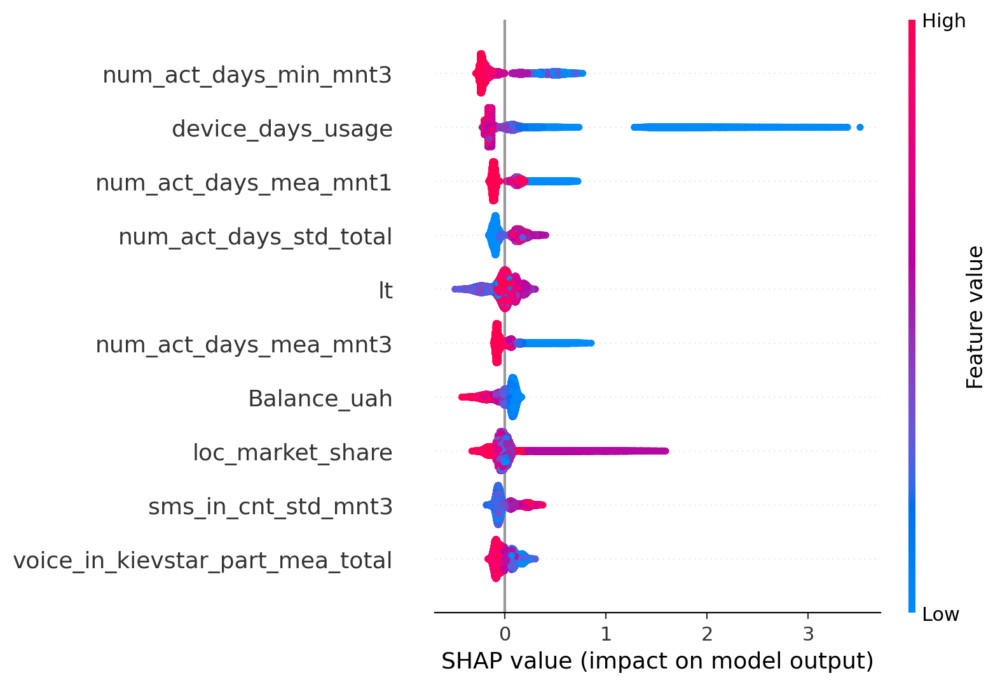

In [41]:
shap.summary_plot(shap_values, test_data[features], max_display=len(shap_features))

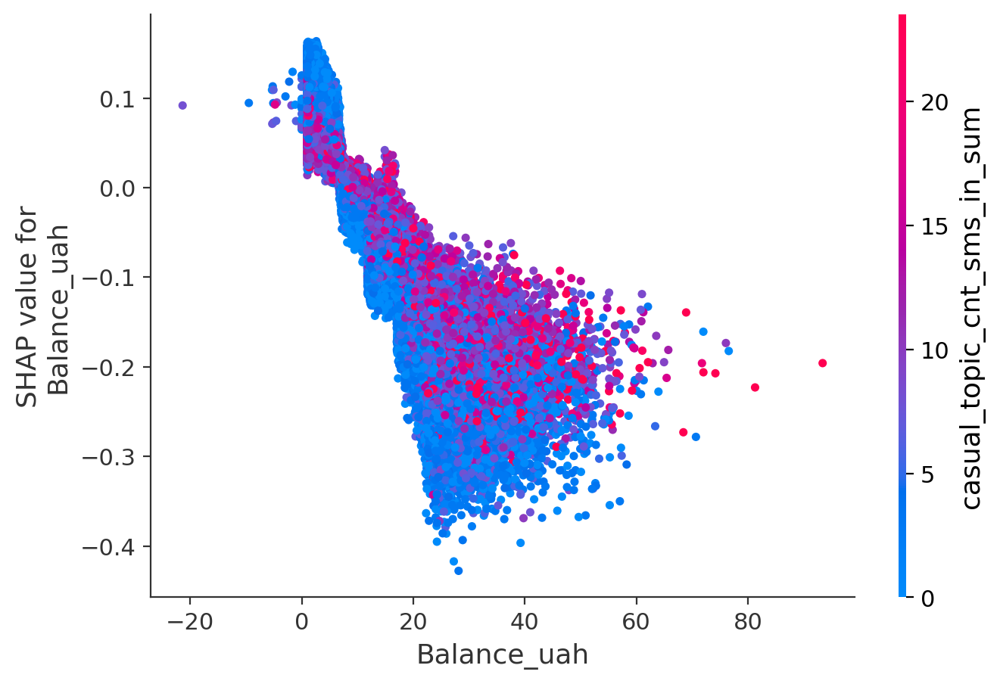

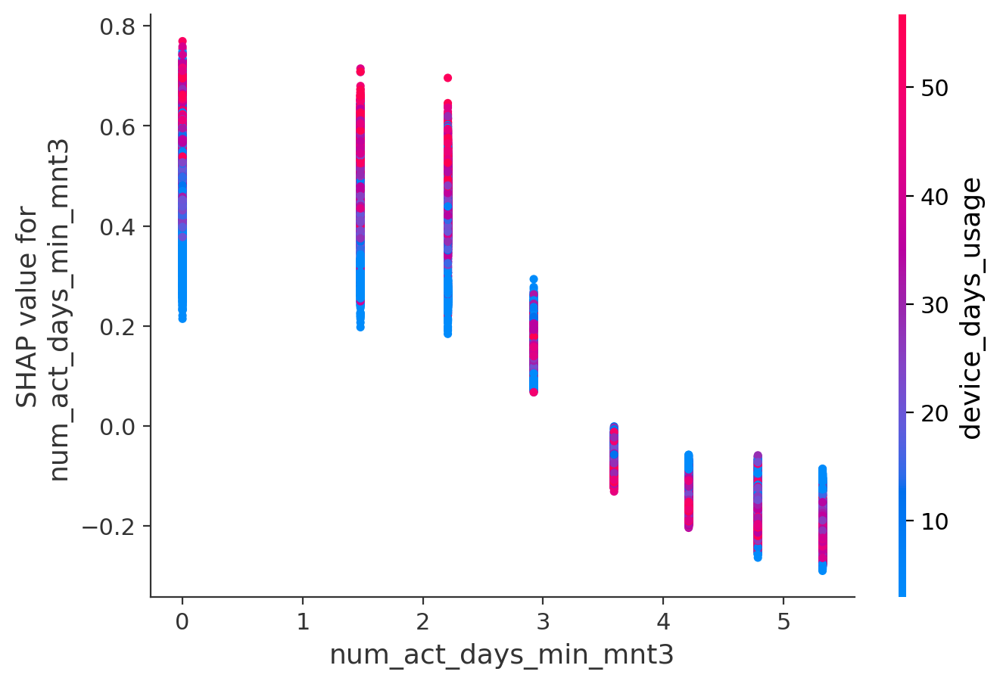

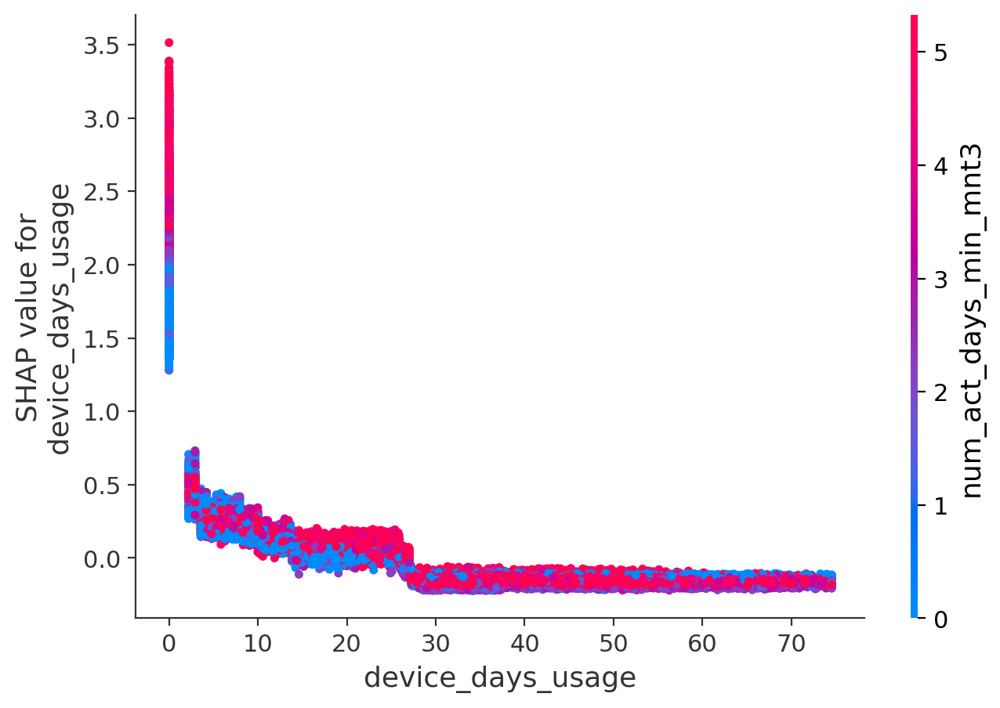

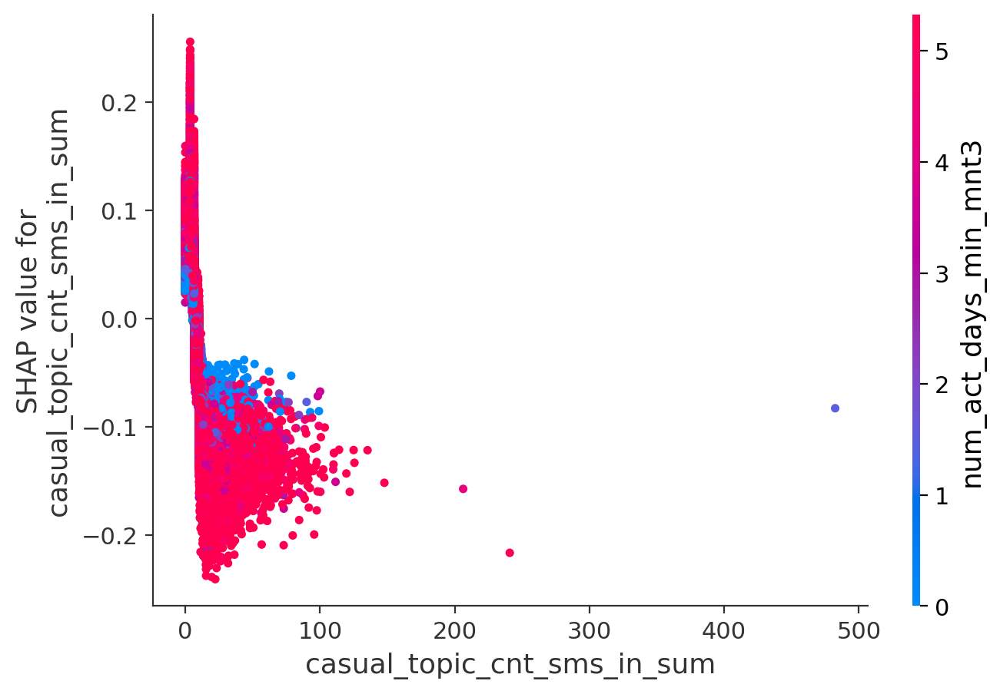

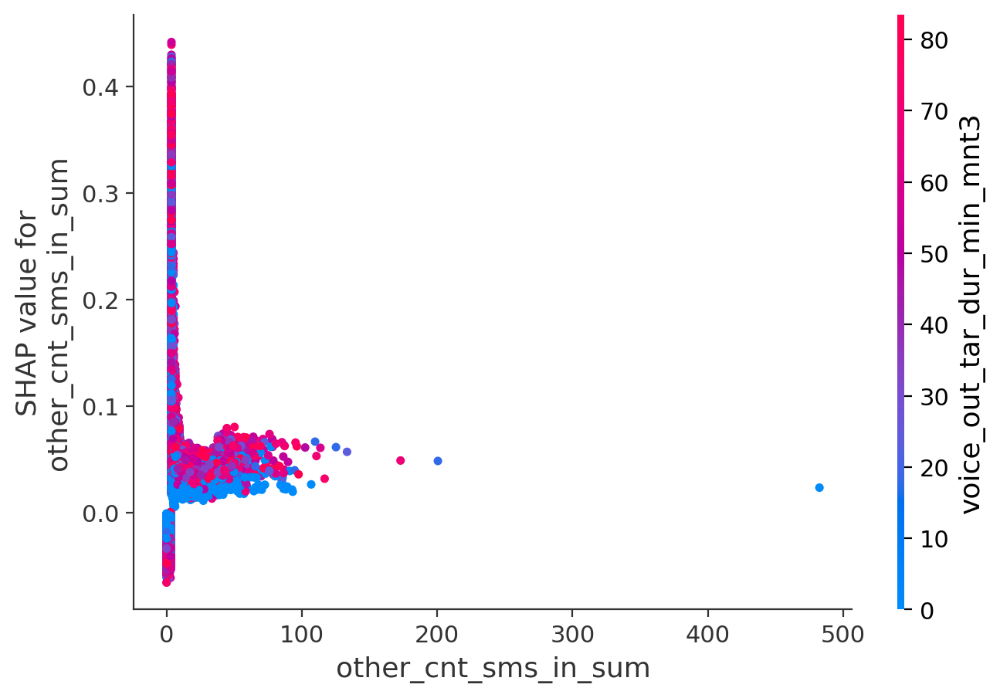

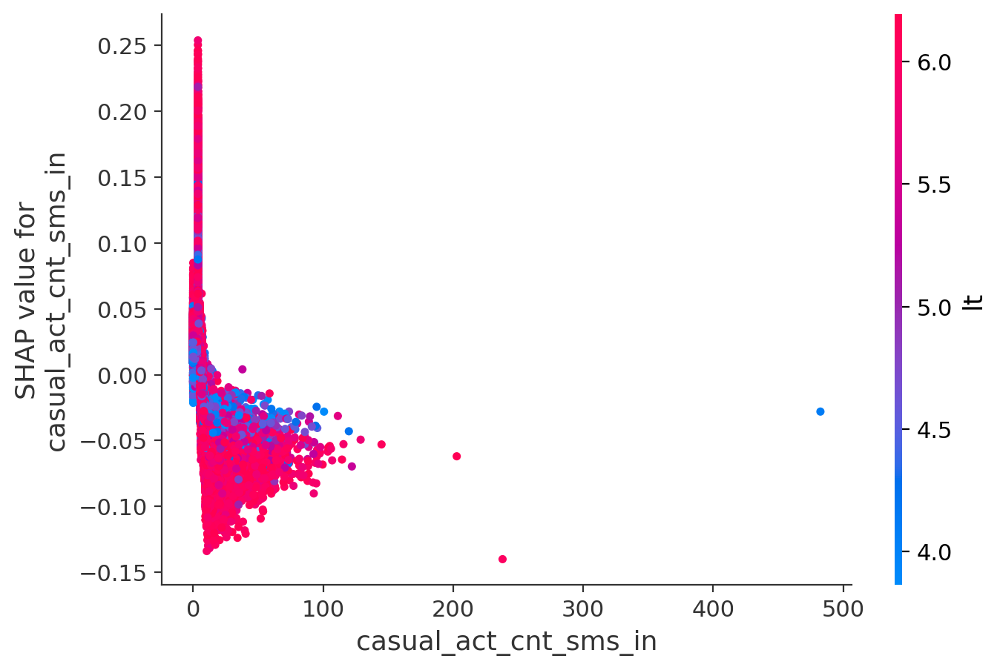

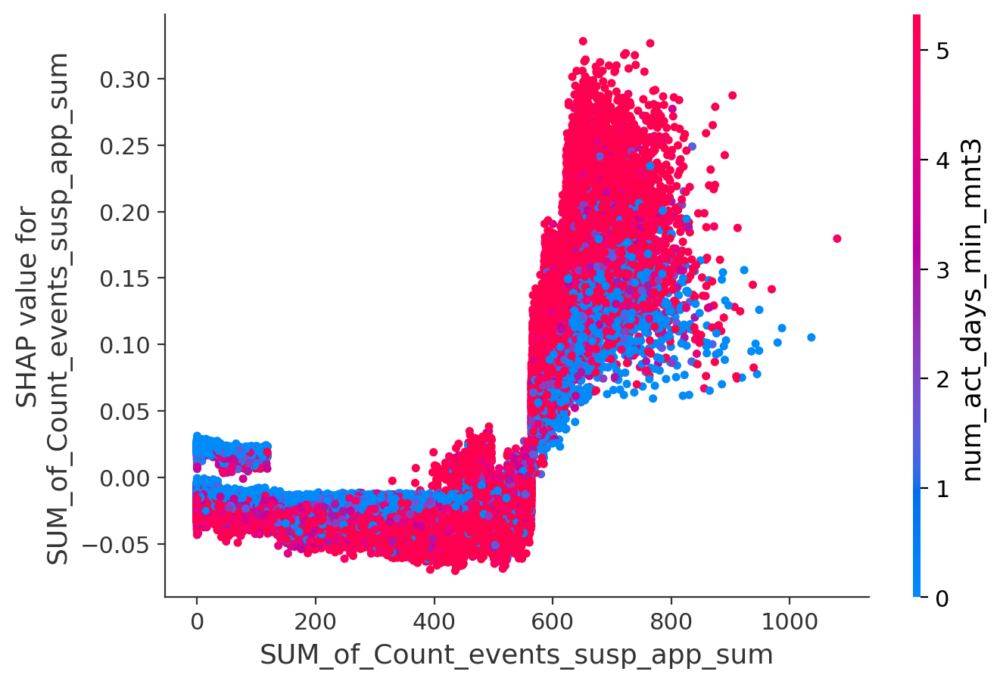

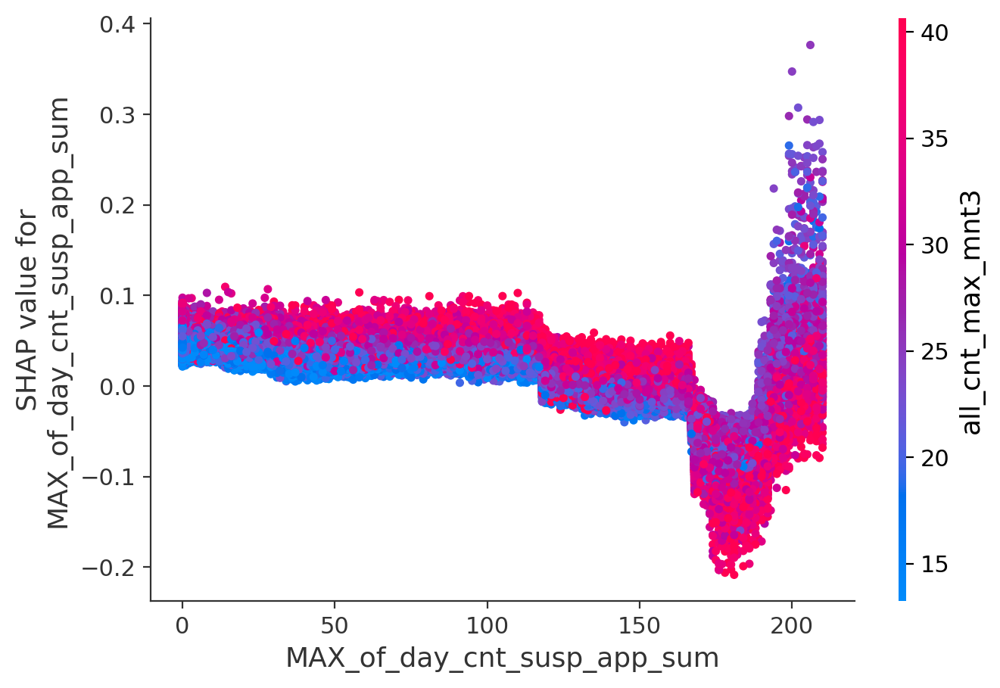

In [42]:
feature_importances_nams = feature_importances["Feature"].values


def render_shap_plot(feature_name):
    shap.dependence_plot(feature_name, shap_values.values, test_data[features])


render_shap_plot("Balance_uah")
render_shap_plot("num_act_days_min_mnt3")
render_shap_plot("device_days_usage")
render_shap_plot("casual_topic_cnt_sms_in_sum")
render_shap_plot("other_cnt_sms_in_sum")
render_shap_plot("casual_act_cnt_sms_in")
render_shap_plot("SUM_of_Count_events_susp_app_sum")
render_shap_plot("MAX_of_day_cnt_susp_app_sum")

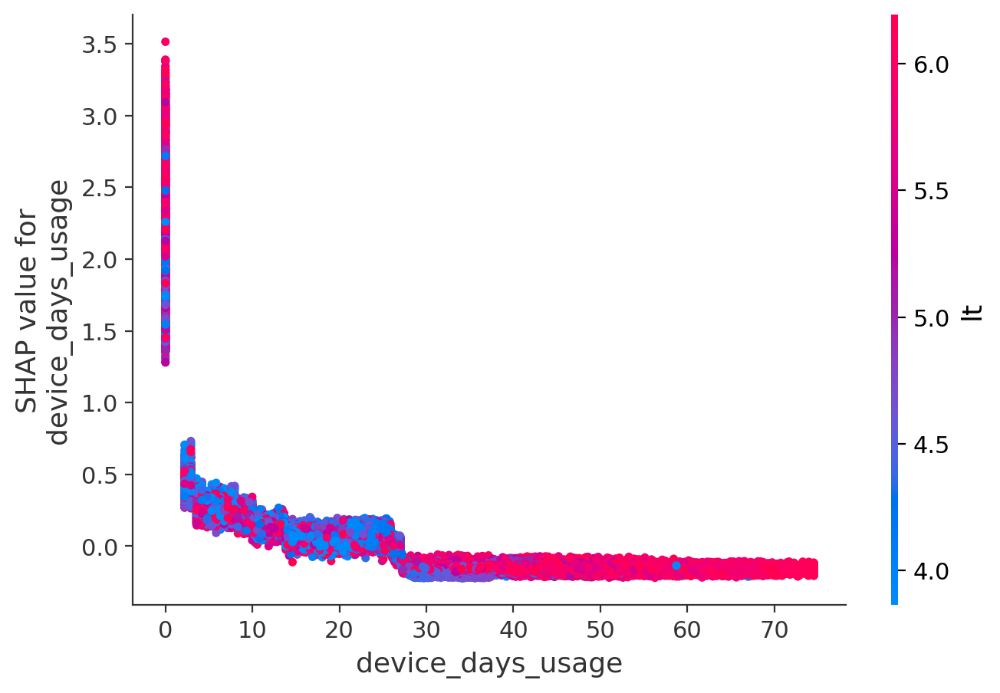

In [43]:
shap.dependence_plot("device_days_usage", shap_values.values, test_data[features], interaction_index="lt")

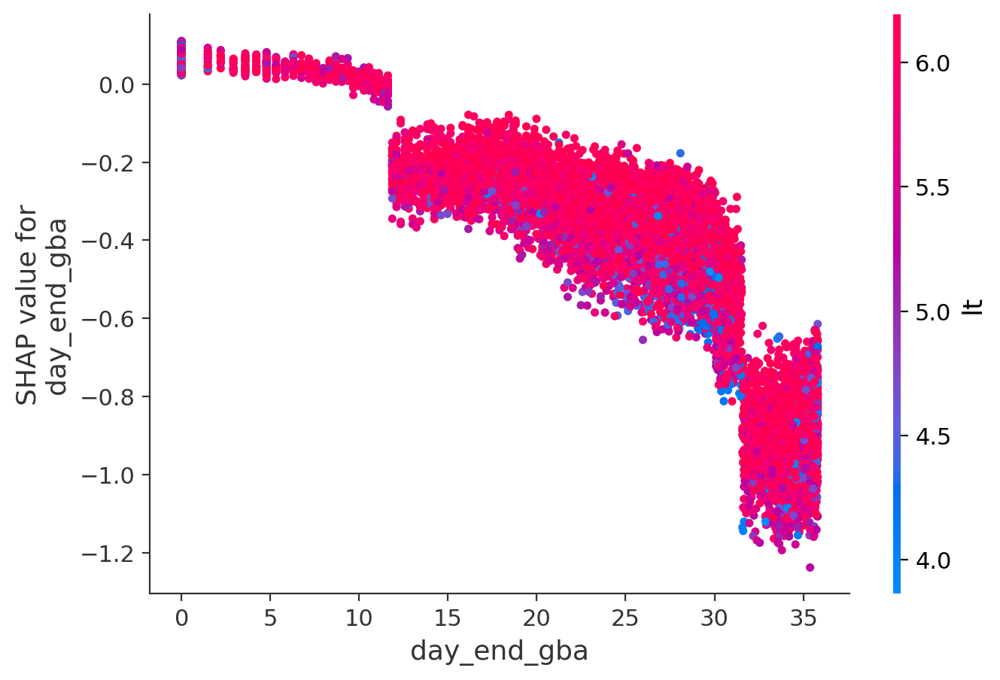

In [44]:
shap.dependence_plot("day_end_gba", shap_values.values, test_data[features], interaction_index="lt")

In [46]:
sub_df = test_data[(test_data.casual_act_cnt_sms_in <= 100) & test_data.casual_act_cnt_sms_in > 0][features]
sub_explainer = shap.TreeExplainer(model_cls)
sub_shap_values = explainer(sub_df)

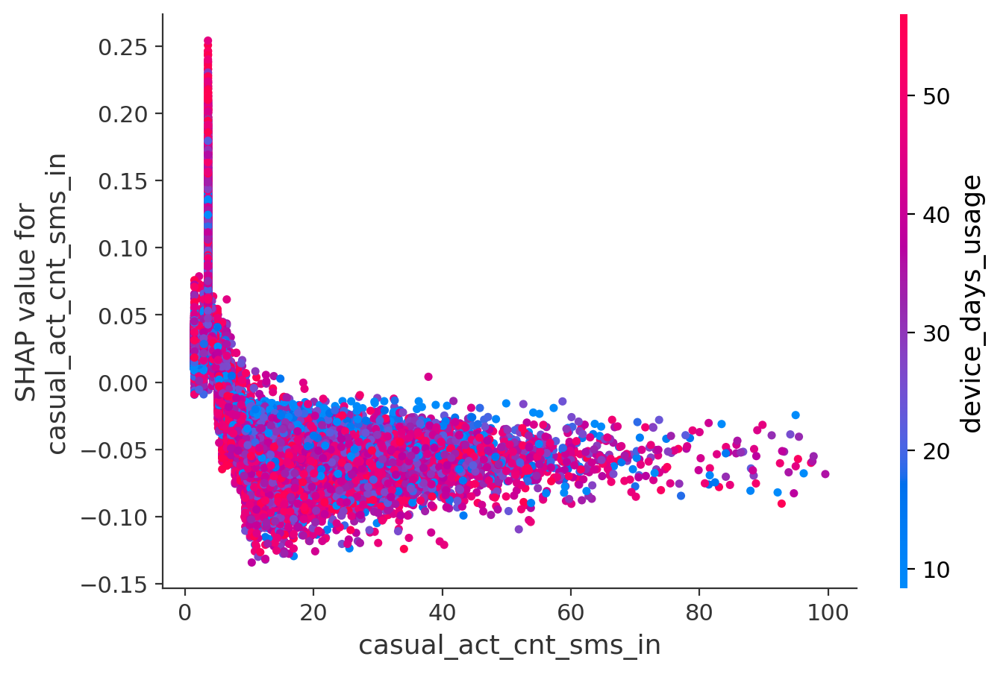

In [47]:
shap.dependence_plot(
    "casual_act_cnt_sms_in", sub_shap_values.values, sub_df, interaction_index="device_days_usage"
)

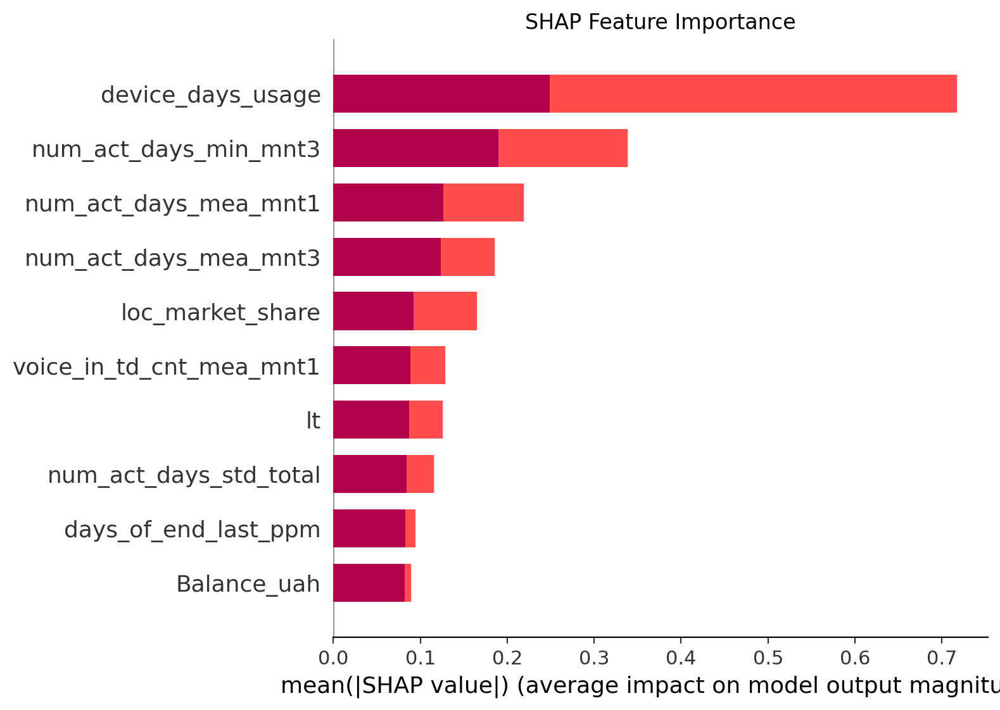

In [54]:
X_test = test_data[features]
y_test = test_data.target

# Розділення SHAP значень за класами
shap_values_0 = shap_values.values[y_test == 0]
shap_values_1 = shap_values.values[y_test == 1]

plt.figure()
shap.summary_plot(shap_values_0, X_test[y_test == 0], plot_type="bar", show=False, color="blue", max_display=10)

# Overlay the plot for the second class (red with opacity)
shap.summary_plot(shap_values_1, X_test[y_test == 1], plot_type="bar", show=False, color="red", max_display=10)

# Adjust the transparency of the red bars
for patch in plt.gca().patches:
    if patch.get_facecolor() == (1.0, 0.0, 0.0, 1.0):
        patch.set_facecolor((1.0, 0.0, 0.0, 0.7))

plt.title("SHAP Feature Importance")
plt.show()

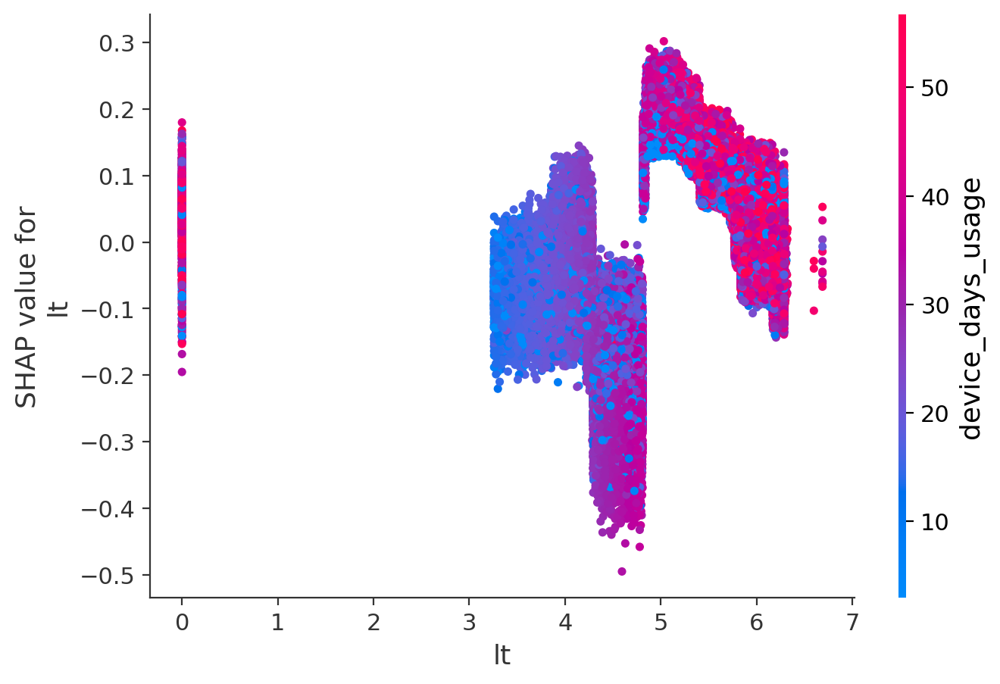

In [55]:
shap.dependence_plot("lt", shap_values.values, test_data[features], interaction_index="device_days_usage")
# Пропонувати клієнтам якісь подарунки на ювілей

In [209]:
# Train
train_data_df = train_data.copy()
train_y_true = train_data_df.target
train_y_pred_proba = model_cls.booster_.predict(train_data_df[features])
train_y_pred = (train_y_pred_proba >= optimal_threshold).astype(int)
train_data_df["pred"] = train_y_pred

# Test
test_data_df = test_data.copy()
test_y_true = test_data_df.target
test_y_pred_proba = model_cls.booster_.predict(test_data[features])
test_y_pred = (test_y_pred_proba >= optimal_threshold).astype(int)
test_data_df["pred"] = test_y_pred

In [210]:
false_churned_train_df = train_data_df[(train_data_df.pred == 0) & (train_data_df.target == 1)]

false_churned_train_df

,Ama_rchrgmnt_sum_max_mnt1,content_clc_mea_mnt1,content_cnt_max_mnt1,voice_out_short_part_max_mnt1,voice_mts_in_nrest_part_std_mnt1,num_act_days_max_mnt1,sms_roam_clc_min_mnt1,voice_in_cmpttrs_avg_durmin_mnt1,com_num_part_mea_mnt1,pay_avg_mea_mnt1,...,other_cnt_sms_in_sum_share,vodafone_services_cnt_sms_in_sum_share,bank_companies_cnt_sms_in_sum_share,casual_topic_cnt_sms_in_sum,finance_topic_cnt_sms_in_sum,casual_topic_cnt_sms_in_sum_share,finance_topic_cnt_sms_in_sum_share,vodafone_act_cnt_sms_in,casual_act_cnt_sms_in,pred
24,0,0.0,12.103587,1.049793,1.042755,5.324077,0,0.0,1.007692,16.459253,...,61.401704,0.000000,0.000000,24.485888,0.000000,83.648224,0.000000,4.786566,21.564076,0
30,0,0.0,12.338681,0.000000,1.002755,5.324077,0,0.0,1.006407,14.327306,...,30.858284,0.000000,47.727583,7.132214,6.512102,52.272417,47.727583,0.000000,4.210402,0
60,0,0.0,0.000000,0.000000,0.000000,5.324077,0,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0
77,0,0.0,6.749902,1.015280,0.000000,5.324077,0,0.0,0.000000,11.615193,...,100.000000,0.000000,0.000000,6.301898,0.000000,100.000000,0.000000,0.000000,6.301898,0
112,0,0.0,12.338681,1.001008,1.000025,5.324077,0,0.0,1.218095,11.893009,...,0.000000,0.000000,9.878860,8.719051,1.480453,58.181037,9.878860,4.786566,2.206949,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149961,0,0.0,13.011325,0.000000,0.000000,4.210402,0,0.0,1.260943,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0
149964,0,0.0,7.964624,0.000000,1.000044,5.324077,0,0.0,1.049793,0.000000,...,0.000000,100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.921812,0.000000,0
149976,0,0.0,9.027098,0.000000,0.000000,5.324077,0,0.0,0.000000,11.677641,...,26.014597,73.985403,0.000000,1.480453,0.000000,26.014597,0.000000,4.210402,1.480453,0
149981,0,0.0,20.526152,1.007842,0.000000,5.324077,0,0.0,1.154105,18.553207,...,0.000000,41.454925,0.000000,0.000000,0.000000,0.000000,0.000000,12.577698,0.000000,0


In [297]:
from sklearn.cluster import KMeans

X = train_data_df[features]

kmeans = KMeans(n_clusters=3, random_state=42)

kmeans.fit(X)

KMeans(n_clusters=3, random_state=42)

In [298]:
X_test = test_data_df[X.columns]

In [299]:
labels = kmeans.labels_

train_data_df["cluster"] = kmeans.predict(X)
test_data_df["cluster"] = kmeans.predict(X_test)

In [300]:
import itertools

dataframe = test_data_df.copy()

features_to_analyse = dataframe.columns[:-2]
clusters = dataframe.cluster.unique()

df = train_data_df.groupby("cluster").mean().T

std_statistic_df = {}

for index in range(len(features_to_analyse)):
    std_statistic_df[features_to_analyse[index]] = df.iloc[index].values.std()

std_statistic_df = pd.DataFrame(std_statistic_df, index=[0])

std_statistic_df.T.sort_values(by=0, ascending=False)[:50]

,0
non_accum_internet_vol_mea_diff,247.237881
voice_out_cmpttrs_avg_dumin_total,212.152061
data_3g_tar_vol_mea_diff,176.872486
non_accum_internet_vol_max_diff,175.582517
non_accum_internet_vol_std_diff,148.611172
data_3g_tar_vol_max_diff,143.461814
non_accum_internet_vol_min_diff,124.915209
data_3g_tar_vol_std_diff,123.196436
non_accum_internet_vol_max_mnt1,91.940343
non_accum_internet_vol_mea_mnt1,86.681585


In [301]:
def combo_plot(df, combo, hue="cluster"):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df, x=combo[0], y=combo[1], hue=hue, palette="viridis")
    plt.title(f"Scatter Plot: {combo[0]} vs {combo[1]}")
    plt.xlabel(combo[0])
    plt.ylabel(combo[1])
    plt.legend(title="Cluster")
    plt.show()

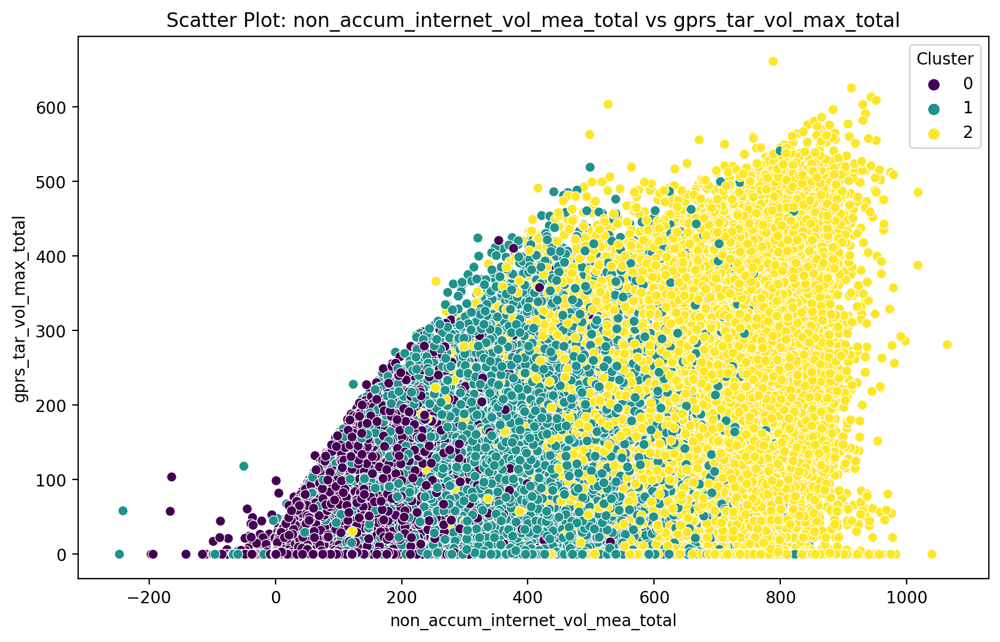

In [302]:
combo_plot(
    dataframe,
    [
        "non_accum_internet_vol_mea_total",
        "gprs_tar_vol_max_total",
    ],
)

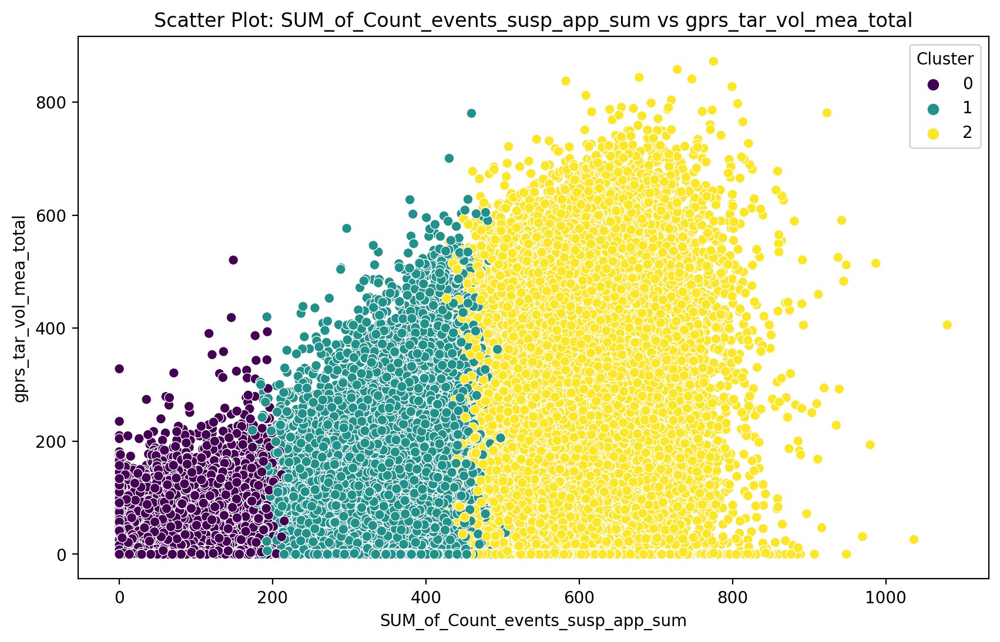

In [303]:
combo_plot(
    dataframe,
    [
        "SUM_of_Count_events_susp_app_sum",
        "gprs_tar_vol_mea_total",  # Тарифицируемый объем передачи данных - стат.метрика
    ],
)

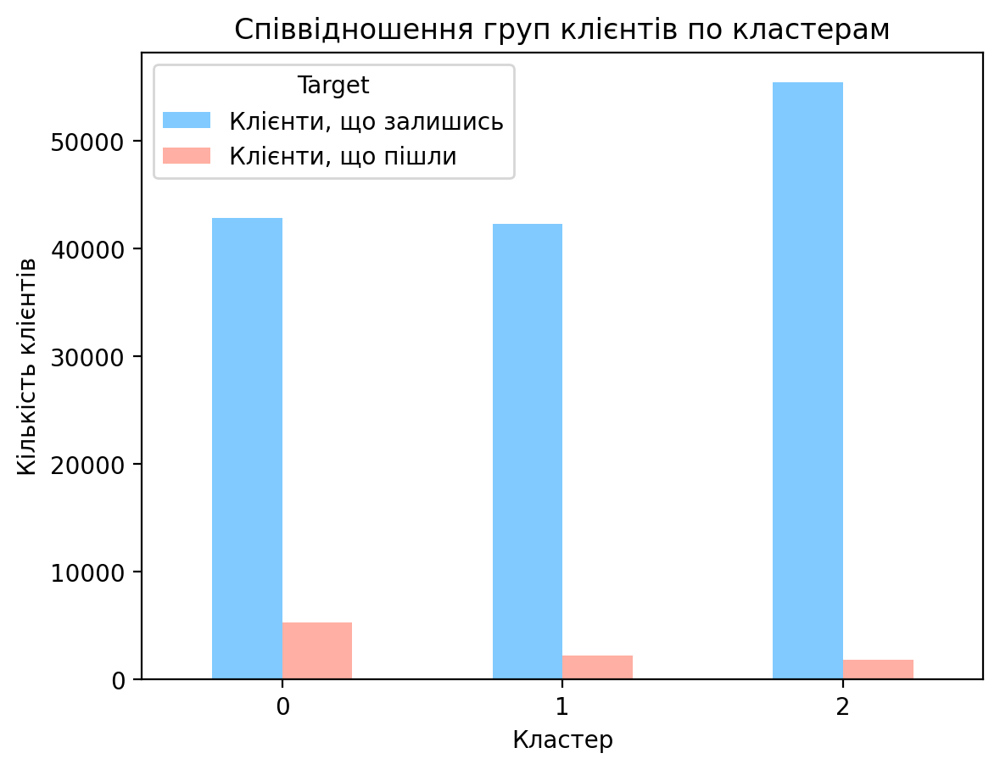

In [332]:
NOT_CHURNED_CLIENT_TITLE = "Клієнти, що залишись"
CHURNED_CLIENT_TITLE = "Клієнти, що пішли"

NOT_CHURNED_COLOR = "#80CAFF"
CHURNED_COLOR = "#FFAFA3"

SNS_TARGET_LABELS = [CHURNED_CLIENT_TITLE, NOT_CHURNED_CLIENT_TITLE]

dataframe["target"] = dataframe.target.astype(int)

df = dataframe.groupby("cluster")["target"].value_counts()

df = df.reset_index()

pivot_df = df.pivot(index="cluster", columns="target", values="count")

# Unstack the pivoted DataFrame to get clusters side by side
unstacked_df = pivot_df.unstack().reset_index()
unstacked_df.columns = ["target", "cluster", "count"]

# Pivot again to get the required format
final_df = unstacked_df.pivot(index="cluster", columns="target", values="count")

# Plotting
final_df.plot(kind="bar", color=[NOT_CHURNED_COLOR, CHURNED_COLOR])
plt.xlabel("Кластер")
plt.ylabel("Кількість клієнтів")
plt.title("Співвідношення груп клієнтів по кластерам")
plt.legend(title="Target", labels=[NOT_CHURNED_CLIENT_TITLE, CHURNED_CLIENT_TITLE])
plt.xticks(rotation=0)
plt.show()

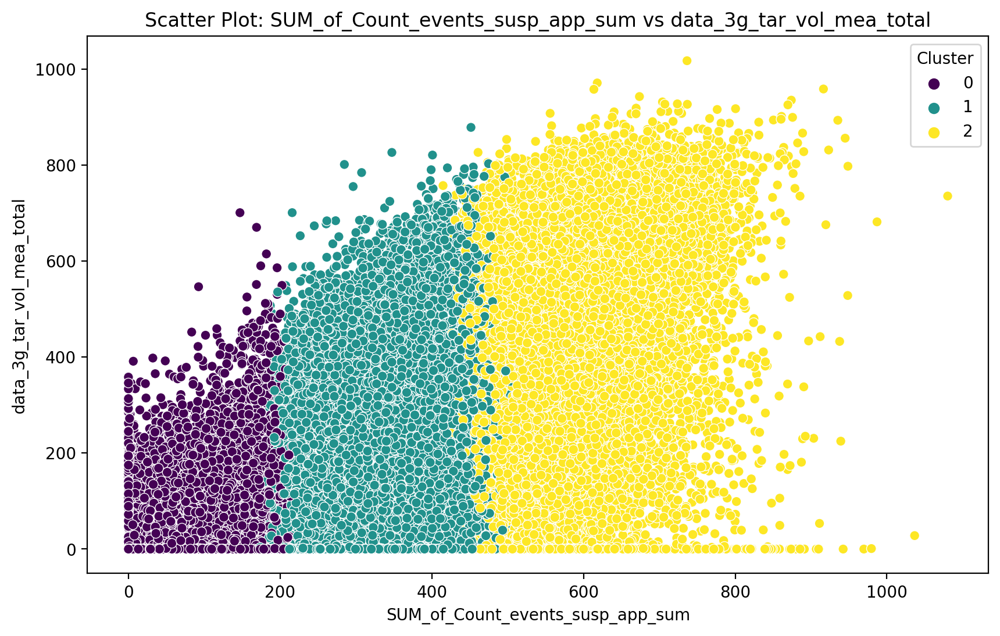

In [305]:
combo_plot(
    dataframe,
    [
        "SUM_of_Count_events_susp_app_sum",
        "data_3g_tar_vol_mea_total",
    ],
)

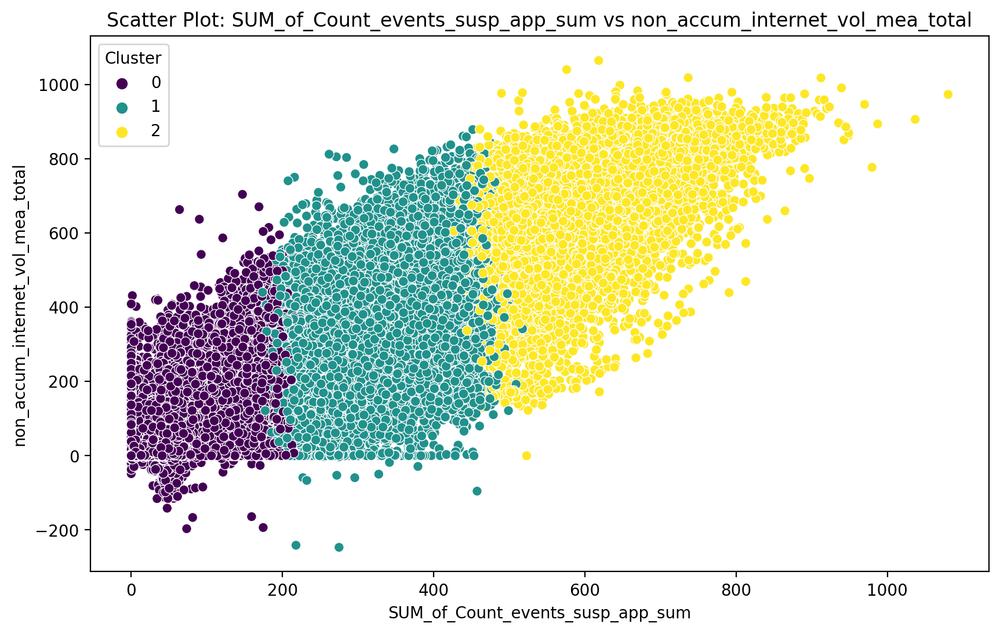

In [306]:
combo_plot(
    dataframe,
    [
        "SUM_of_Count_events_susp_app_sum",
        "non_accum_internet_vol_mea_total",  # Объем переданных данных вне пакета услуг - стат.метрика
    ],
)